# Directional Estimation

A key feature of multiple antenna arrays is that the angles of arrival of different paths can be visible.  This property is key for beamforming, spatial separation, and various localization algorithms.  In this demo, you will explore directional estimation in a simulation of a short-range link in the NYU Tandon campus.  In going through the demo, you will learn to:

* Load a pre-generated scene from the `sionnautils` package
* Place a multiple antenna receiver in a location similar to a microcellular deployment
* Get and plot the rays and visualize the angles of arrival
* Compute the directional PDP
* Use peak detection to find the strongest path in the multi-path profile.

## Importing Sionna
We first load the sionna package as usual.  We also load the `sionnautils` package that I have added to support the computation of spatial signatures.

In [221]:
import numpy as np
import matplotlib.pyplot as plt

In [224]:
import os # Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0 # Use "" to use the CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Import Sionna
try:
    import sionna
except ImportError as e:
    # Install Sionna if package is not already installed
    import os
    os.system("pip install sionna")
    import sionna

# Configure the notebook to use only a single GPU and allocate only as much memory as needed
# For more details, see https://www.tensorflow.org/guide/gpu
import tensorflow as tf
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Avoid warnings from TensorFlow
tf.get_logger().setLevel('ERROR')

# Colab does currently not support the latest version of ipython.
# Thus, the preview does not work in Colab. However, whenever possible we
# strongly recommend to use the scene preview mode.
try: # detect if the notebook runs in Colab
    import google.colab
    no_preview = True # deactivate preview
except:
    if os.getenv("SIONNA_NO_PREVIEW"):
        no_preview = True
    else:
        no_preview = False

resolution = [480,320] # increase for higher quality of renderings

# Define magic cell command to skip a cell if needed
from IPython.core.magic import register_cell_magic
from IPython import get_ipython

@register_cell_magic
def skip_if(line, cell):
    if eval(line):
        return
    get_ipython().run_cell(cell)


In [225]:
# Import Sionna utils from the wireless class
try:
    import sionnautils
except ImportError as e:
    # Install Sionna if package is not already installed
    !pip install git+https://github.com/sdrangan/wirelesscomm.git
    import sionnautils

## Create a Scene
To illustrate, let's create a simple test scene in the area of the NYU Tandon campus.


In [226]:
from sionnautils.custom_scene import list_scenes, get_scene
scene_path, map_data = get_scene('nyu_tandon')
scene = sionna.rt.load_scene(scene_path)
freq = 6e9
scene.frequency = freq
# Render scene
if no_preview:
    scene.render(camera="scene-cam-0", num_samples=512);

In [227]:
%%skip_if no_preview
# Open 3D preview (only works in Jupyter notebook)
scene.preview()

Renderer(camera=PerspectiveCamera(aspect=1.31, children=(DirectionalLight(intensity=0.25, position=(0.0, 0.0, …

## Add Transmitters and Receivers

We will place the receiver on top of one of the campus buildings at 5 MetroTech and the transmitter in the courtyard south of the building.
We will move the RX slightly to the south so that it is at the edge of the building.

In [228]:
from geopy.geocoders import Nominatim
from sionnautils.custom_scene import get_scene,  lat_lon_to_xy
from sionnautils.miutils import get_elevation

# Initialize Nominatim geocoder
geolocator = Nominatim(user_agent="wireless_class")

# Address to get coordinates for
address = "5 MetroTech Center, Brooklyn, NY 11201"
#address = "370 Jay St, Brooklyn, NY 11201"

# Geocode the address
location = geolocator.geocode(address)

# Set the lat-long
lat = location.latitude
long  = location.longitude

# Place the RX on 10m above the top of the building
xrx, yrx = lat_lon_to_xy(
    map_data['bbox_lat'], map_data['bbox_long'], lat, long)
zmin, zmax = get_elevation(scene._scene, xrx, yrx)
rxpos = np.array([xrx, yrx-20, zmax+10])

# Place the TX south of the RX in the 
# courtyard with an elevation 2m above the ground
xtx = xrx
ytx = yrx - 50
zmin, zmax = get_elevation(scene._scene, xtx, ytx)
txpos = np.array([xtx, ytx, zmax+2])


Next, we add the TX and RX objects.  For the TX, we will use a single dipole antenna, which is close to isotropic.  Since we have multiple RX antennas and a single TX antenna, we have a SIMO channel.  In a SIMO channel, we can estimate angles of arrivals, but not angles of departure.  In a subsequent demo, I will how we can use MIMO measurements to estimate both angles of arrival and angles of departure.

In [229]:
import sionna as sn

# Configure antenna array for all RX
rxdim = np.array([8,4])
nantrx = np.prod(rxdim)
scene.rx_array = sn.rt.PlanarArray(num_rows=rxdim[0],
                             num_cols=rxdim[1],
                             vertical_spacing=0.5,
                             horizontal_spacing=0.5,
                             pattern="tr38901",
                             polarization="V")


# Configure antenna array for all TX
txdim = np.array([1,1])
nanttx = np.prod(txdim)
scene.tx_array = sn.rt.PlanarArray(num_rows=txdim[0],
                             num_cols=txdim[1],
                             vertical_spacing=0.5,
                             horizontal_spacing=0.5,
                             pattern="dipole",
                             polarization="V")

# Remove all previous TX and RX
for tx in scene.transmitters:
    scene.remove(tx)
for rx in scene.receivers:
    scene.remove(rx)
    
# Create transmitter
tx = sn.rt.Transmitter(name="tx", position=txpos)
scene.add(tx)

# Create the receiver
rx = sn.rt.Receiver(name="rx", position=rxpos)
scene.add(rx)

# Point the TX and RX at one another
tx.look_at(rx)
rx.look_at(tx)


## Computing and Visualizing the Paths

Next, we compute and display the paths

In [230]:
scene.synthetic_array = True
paths = scene.compute_paths()
# Visualize paths in the scene
if no_preview:
    scene.render("my_cam", paths=paths, show_devices=True, show_paths=True, resolution=resolution);

In [238]:
%%skip_if no_preview
scene.preview(paths, show_devices=True, show_paths=True) # Use the mouse to focus on the visualized paths

Renderer(camera=PerspectiveCamera(aspect=1.31, children=(DirectionalLight(intensity=0.25, matrixWorldNeedsUpda…

The ray tracing computes all the paths from the TX to RX.  The code below extracts the path information.  The slicing `[0,0,0,:]` extracts the data for the single TX and RX.

In [232]:
a = path_dict['tau']
a.shape

TensorShape([1, 1, 1, 19])

In [233]:
path_dict = paths.to_dict()
print(path_dict['tau'].shape)
a = path_dict['a'].numpy()[0,0,:,0,0,:,0]
tau = path_dict['tau'].numpy()[0,0,0,:]
theta_r = path_dict['theta_r'].numpy()[0,0,0,:]
phi_r = path_dict['phi_r'].numpy()[0,0,0,:]

npaths = len(phi_r)


(1, 1, 1, 19)


First, let's plot the path gains vs. delay.  For the path gains, we compute the average gain across the `nantrx` receive antennas.

Text(0, 0.5, 'Path gain [dB]')

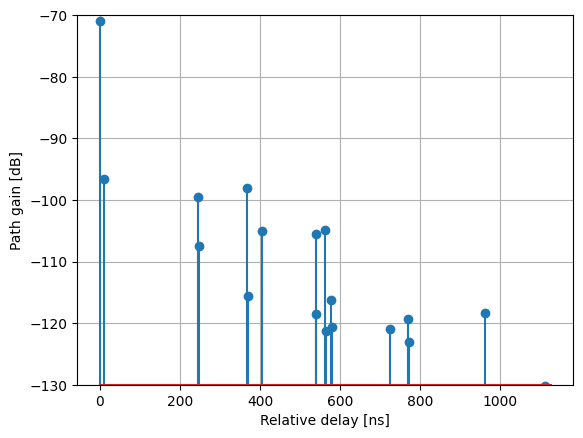

In [234]:
gain_avg = 10*np.log10(np.mean(np.abs(a)**2, axis=0))

# Get axis limits
gmax = np.max(gain_avg)
ymax = 10*np.ceil(gmax/10)
ymin = ymax-60
plt.stem(tau*1e9, gain_avg, bottom=ymin)
plt.ylim([ymin, ymax])
plt.grid()
plt.xlabel('Relative delay [ns]')
plt.ylabel('Path gain [dB]')

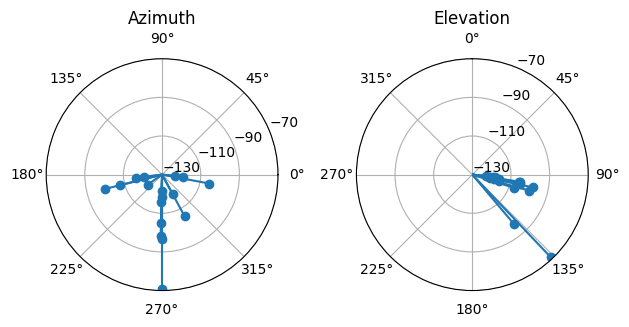

In [235]:
ax = plt.subplot(1,2,1, projection='polar')
ax.stem(phi_r, gain_avg, bottom=ymin)
ax.set_ylim([ymin, ymax])
yticks = np.arange(ymin, ymax+20, 20)
ax.set_yticks(yticks)
ax.set_title('Azimuth')

ax = plt.subplot(1,2,2, projection='polar')
ax.set_theta_direction(-1)  # Clockwise
ax.set_theta_offset(np.pi / 2)  # Set zero to the top
ax.stem(theta_r, gain_avg, bottom=ymin)
ax.set_ylim([ymin, ymax])
_ = ax.set_yticks(yticks)
ax.set_title('Elevation')

plt.tight_layout()

## Measuring the AoA from the Impulse Response

In practice, we cannot directly access the path parameters such as`a`, `theta_r` and so on.  Instead, the TX can send a reference signal from which the RX can estimate the impulse response across the antennas.  It can then estimate the path path parameters from this impulse response.  To illustrate, we first compute the channel impulse response wit the code below.  The impulse response is scaled so that the energy per tap is the relative to the noise energy.  

We have also plotted the true path energy.  You can see that the measured impulse response is a blurred version of the true impulse response.  Each tap in the true channel results in a sinc function that leads to a large "skirt".

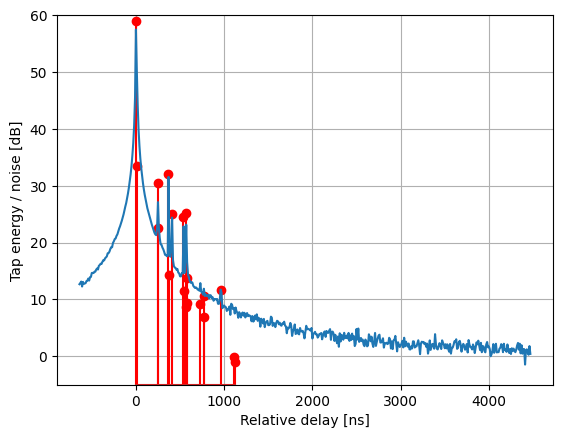

In [250]:
Pul = 10     # Uplink TX power in dBm
Wul = 100e6  # Uplink bandwidth
Tul = 1e-5   # Uplink TX time
NFul = 4       # Uplink noise figure
EkT = -174    # Noise energy in dBm/Hz
ntaps = 512  # Number of channel taps to estimate

# Create a random time offset of the first path within the sampling period
toff = np.random.uniform(-0.5/Wul, 0.5/Wul)

# Get the channel
a_tf = path_dict['a'] 
tau_tf = path_dict['tau'] + toff
l_min = -64
l_max = ntaps + l_min - 1
h_tf = sn.channel.cir_to_time_channel(Wul,a_tf, tau_tf,l_min=l_min,l_max=l_max)

# Extract the channel 
h = h_tf.numpy()[0,0,:,0,0,0,:]

# Scale the impulse response to the noise
scale_db = Pul-NFul-EkT + 10*np.log10(Tul)
scale = 10**(0.1*scale_db)
h = np.sqrt(scale)*h

# Add noise.  
nantrx, ntaps = h.shape
w = 1/np.sqrt(2)*(np.random.normal(0,1,h.shape) + 1j*np.random.normal(0,1,h.shape))
hnoisy = h + w

# Get the impulse response per tap
h_avg = 10*np.log10(tf.reduce_mean( tf.abs(hnoisy)**2, axis=0 ))

# Get the time
t = np.arange(l_min,l_max+1)/Wul*1e9


# Get the true paths
a = path_dict['a'].numpy()[0,0,0,0,:,:,0]
apow = 10*np.log10(np.sum(np.abs(a)**2, axis=0))
tau = path_dict['tau'].numpy()[0,0,0,:]
tap_energy = scale_db + apow

# Set the axis limits
ymax = np.max(h_avg)
ymax = np.maximum(ymax, np.max(tap_energy))
ymax = np.ceil(ymax/10)*10
ymin = np.minimum(ymax-30,-5)
plt.ylim([ymin, ymax])

# Plot the true paths and the estimated channel response
plt.stem(tau*1e9, tap_energy, bottom=ymin, linefmt='r', markerfmt='r', label='True')
plt.plot(t, h_avg, label='Estimated')
plt.grid()
plt.xlabel('Relative delay [ns]')
_ = plt.ylabel('Tap energy / noise [dB]')


To measure the directional PDP, we recall that the impulse response is given by (see the [Nvidia page](https://nvlabs.github.io/sionna/api/channel.wireless.html#sionna.channel.cir_to_time_channel)):
~~~
    h[:,j] = \sum_k sinc(j-W*tau[k])*a[:,k],  
~~~
Hence at a tap `j/W ~= tau[k]` we will see the response `a[:,k]`. The response `a[:,k]` is the spatial signature corresponding to the AoA `(theta_r[k], phi_r[k])`.  Therefore, to see the angular response, we discretize the angular space and then correlate against the spatial signature.  The resulting correlation is stored in `hsv`.  We see the peaks of the angular response, but there are two key points:

* Around each peak, we see significant blurring in the angular domain. This is expected since the antenna has a limited resolution in the angular domain.
* There is a mirror image of each point at `phi+pi` since the array response is identical to points from behind the array.  In practice we can limit the search over angles in a 180 degree sector around the `yaw = rx.orientation[0]`.

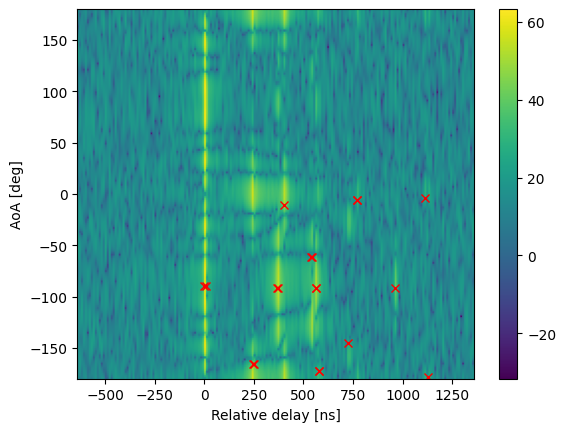

In [237]:
from sionnautils.antenna import spatial_sig

yaw = rx.orientation[0]
nphi = 180
#phi =  tf.linspace(yaw-np.pi/2, yaw+np.pi/2, nphi)
phi =  tf.linspace(-np.pi, np.pi, nphi)
theta = tf.ones(nphi, dtype=tf.float32)*np.pi/2
sv_tf = spatial_sig(rx, theta, phi, freq)
sv = sv_tf.numpy()

phi_deg = np.rad2deg(phi.numpy())


hsv = np.sum(sv[:,:,None] * hnoisy[:,None,:], axis=0)
hsv = 10*np.log10( np.abs(hsv)**2 )
plt.imshow(hsv[:,:200], extent=[t[0], t[200], phi_deg[0], phi_deg[-1]], aspect='auto' )
plt.xlabel('Relative delay [ns]')
plt.ylabel('AoA [deg]')
#plt.imshow(hsv, aspect='auto')
plt.colorbar()

# Plot the actual taps
phi_r = path_dict['phi_r'].numpy()[0,0,0,:]
phi_r_deg = np.rad2deg(phi_r)
plt.plot(tau*1e9, phi_r_deg, 'rx') 

The multi-path components can now be found by some sort of peak detection.  Getting this to work is a little hard and requires calibration if you want it to work reliably.  In the future I will add a quick demo of some algorithms.

In [249]:
U, s, Vh = np.linalg.svd(h, compute_uv=True, full_matrices=False)